# Проект 4 - поиск изображений по запросу

## Описание проекта
Вам поручено разработать демонстрационную версию поиска изображений по запросу.
Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

## Юридические ограничения
В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет. \
В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер: This image is unavailable in your country in compliance with local laws. \
Однако в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер. 


## Описание данных
В файле train_dataset.csv находится информация, необходимая для обучения: 
1. имя файла изображения
2. идентификатор описания и текст описания. 

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

1. В папке train_images содержатся изображения для тренировки модели.
2. В файле CrowdAnnotations.tsv  — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:
    * Имя файла изображения.
    * Идентификатор описания.
    * Доля людей, подтвердивших, что описание соответствует изображению.
    * Количество человек, подтвердивших, что описание соответствует изображению.
    * Количество человек, подтвердивших, что описание не соответствует изображению.
3. В файле ExpertAnnotations.tsv  — данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:
    * Имя файла изображения.
    * Идентификатор описания.
    * 3, 4, 5 — оценки трёх экспертов. 

Эксперты ставят оценки по шкале от 1 до 4, где:
* 1 — изображение и запрос совершенно не соответствуют друг другу
* 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует
* 3 — запрос и текст соответствуют с точностью до некоторых деталей
* 4 — запрос и текст соответствуют полностью.      
4. В файле test_queries.csv находится информация, необходимая для тестирования: 
    * идентификатор запроса
    * текст запроса и релевантное изображение. 
Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.
В папке test_images содержатся изображения для тестирования модели.




## Подключение библиотек

In [1]:
!pip install -q --upgrade keras-nlp tensorflow
!pip install -q sentence-transformers

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pickle

import nltk
import re
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
!unzip /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/nltk_data/corpora/

from PIL import Image

from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Flatten, Dropout, BatchNormalization)
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow import keras
import tensorflow as tf
import keras_nlp

from tqdm import notebook

from sklearn.model_selection import GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler

import sentence_transformers
from sentence_transformers import SentenceTransformer, util
import glob

[nltk_data] Downloading package stopwords to
[nltk_data]     /kaggle/working/stopwords...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /kaggle/working/punkt...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /kaggle/working/wordnet...
[nltk_data] Downloading package omw-1.4 to /kaggle/working/omw-1.4...
Archive:  /usr/share/nltk_data/corpora/wordnet.zip
   creating: /usr/share/nltk_data/corpora/wordnet/
  inflating: /usr/share/nltk_data/corpora/wordnet/lexnames  
  inflating: /usr/share/nltk_data/corpora/wordnet/data.verb  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.adv  
  inflating: /usr/share/nltk_data/corpora/wordnet/adv.exc  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.verb  
  inflating: /usr/share/nltk_data/corpora/wordnet/cntlist.rev  
  inflating: /usr/share/nltk_data/corpora/wordnet/data.adj  
  inflating: /usr/share/nltk_data/corpora/wordnet/index.adj  
  inflating: /

2024-04-23 10:19:48.160924: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-23 10:19:48.160981: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-23 10:19:48.162517: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Using TensorFlow backend


## Константы

In [3]:
PATH = 'dsplus_integrated_project_4//to_upload//'
SEED = 777
BLOCK = ['teenage', 'baby', 'child', 'teenager', 'girl', 'boy', 'kid', 'baby', 'boy', 'daughter', 'girl',
         'juvenile', 'kid', 'minor', 'offspring', 'son', 'youngster', 'youth', 'babe', 'bairn', 'bambino',
         'brat', 'chick', 'cub', 'imp', 'innocent', 'lamb', 'moppet', 'nestling', 'nipper', 'shaver', 'sprout',
         'squirt', 'stripling', 'suckling', 'tadpole', 'tot', 'tyke', 'urchin', 'anklebiter', 'gamin', 'gamine',
         'kiddie', 'pubescent', 'small fry', 'young one']

np.random.seed(SEED)
tf.random.set_seed(SEED)

## Исследовательский анализ данных

In [4]:
def read_df(path=PATH) -> pd.DataFrame:

   
    df_train = pd.read_csv(Path(path, 'train_dataset.csv'))#.sample(frac=0.1)
    df_crowd = pd.read_csv(Path(path, 'CrowdAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])
    df_expert = pd.read_csv(Path(path, 'ExpertAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'first', 'second', 'third'])
    df_queries = pd.read_csv(Path(path, 'test_queries.csv'), index_col=[0], sep='|')
    df_images = pd.read_csv(Path(path, 'test_images.csv'), sep='|')
    
    return df_train, df_crowd, df_expert, df_queries, df_images

df_train, df_crowd, df_expert, df_queries, df_images = read_df()

In [5]:
display(df_train.head(), df_crowd.head(), df_expert.head(), df_queries.head(), df_images.head())

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


<div class="alert alert-secondary" role="alert">
<b>Заметка:</b></div>

1) Датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

2) В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. 

3) В файле с краудсорсинговыми оценками информация расположена в таком порядке: 
* Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
* Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
* Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.



In [6]:
print('Количество уникальных фото на трейне:', len(df_train['image'].unique()))
print('Количество уникальных фото на тесте:', len(df_queries['image'].unique()))

Количество уникальных фото на трейне: 1000
Количество уникальных фото на тесте: 100


In [7]:
print('Количество уникальных запросов на тесте:', df_queries.drop_duplicates().shape[0])

Количество уникальных запросов на тесте: 500


In [8]:
print('Количество уникальных сочетаний фото-текст оцененных экспертами:', df_expert.drop_duplicates().shape[0])
print('Количество уникальных сочетаний фото-текст оцененных людьми:', df_crowd.drop_duplicates().shape[0])

Количество уникальных сочетаний фото-текст оцененных экспертами: 5822
Количество уникальных сочетаний фото-текст оцененных людьми: 47830


<Axes: >

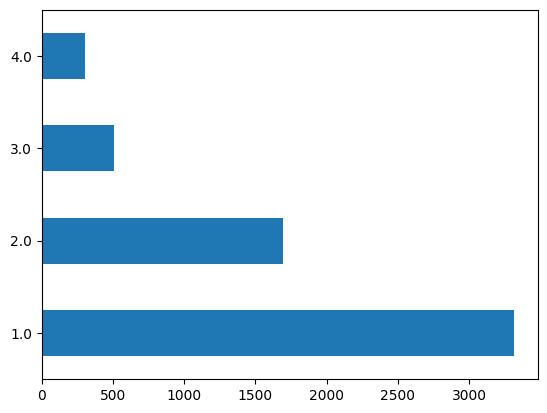

In [9]:
f, ax = plt.subplots(figsize=(10, 15));
round(
        (df_expert.drop_duplicates()['first'] + 
         df_expert.drop_duplicates()['second'] + 
         df_expert.drop_duplicates()['third'])
        /3).value_counts().plot(kind='barh')
ax.set(xlabel="Количество",
       ylabel="Оценка");
plt.title("Распредлеение оценок экспертов");

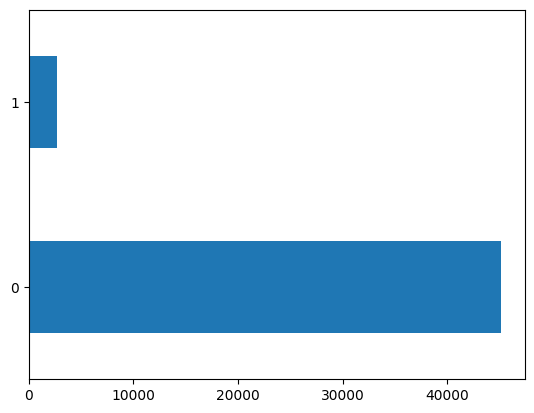

In [10]:
f, ax = plt.subplots(figsize=(10, 15));
df_crowd.apply(lambda x: 1 if x.count_pos > x.count_neg else 0, axis=1).value_counts().plot(kind='barh');

ax.set(xlabel="Количество",
       ylabel="Оценка");
plt.title("Распредлеение оценок данных с помощью краудсорсинга");

In [11]:
print('Уникальных текстовых описаний в трейне:', len(set(df_train['query_text'])))
print('Уникальных текстовых описаний в тесте:', len(set(df_queries['query_text'])))
print('Уникальных текстовых описаний которые есть в обоих наборах:', len(set(df_train['query_text']) & set(df_queries['query_text'])))

Уникальных текстовых описаний в трейне: 977
Уникальных текстовых описаний в тесте: 500
Уникальных текстовых описаний которые есть в обоих наборах: 0


In [12]:
print('Уникальных картинок в трейне:', len(set(df_train['image'])))
print('Уникальных картинок в тесте:', len(set(df_queries['image'])))
print('Уникальных картинок которые есть в обоих наборах:', len(set(df_train['image']) & set(df_queries['image'])))

Уникальных картинок в трейне: 1000
Уникальных картинок в тесте: 100
Уникальных картинок которые есть в обоих наборах: 0


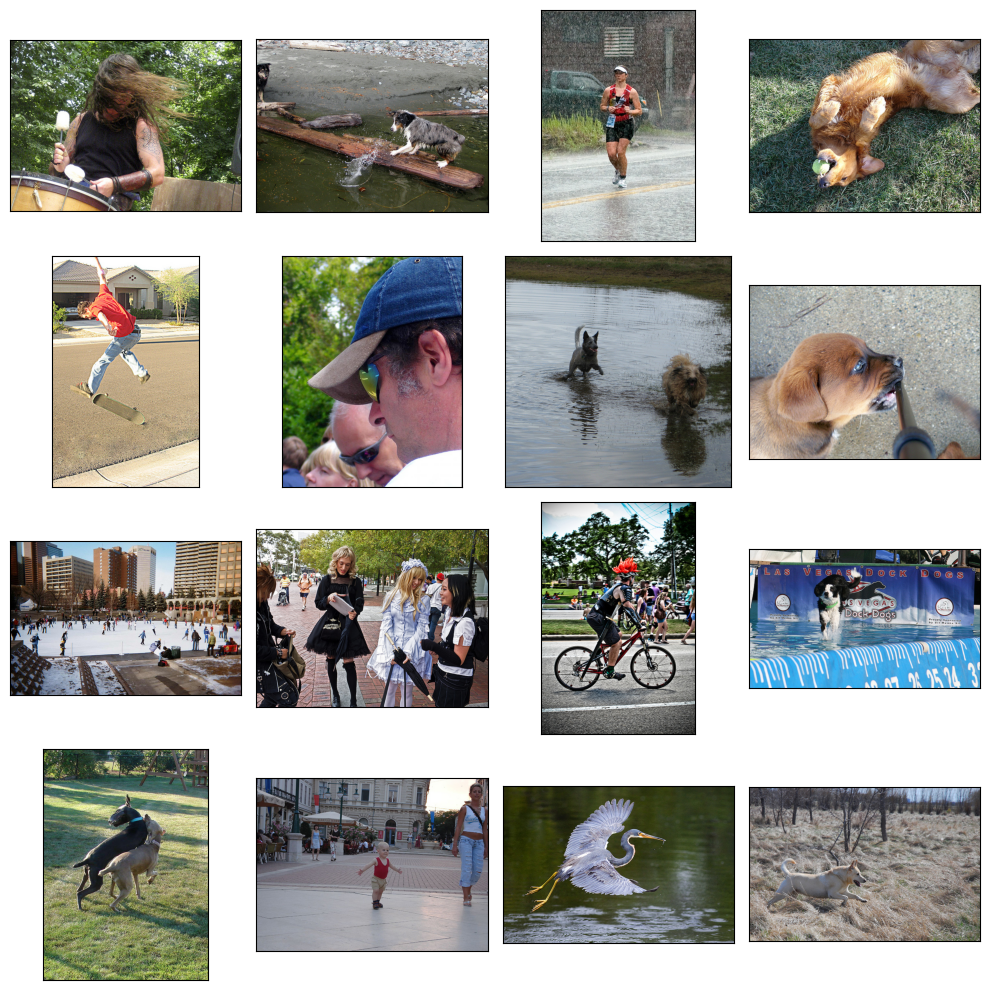

In [13]:
samples_train = list(df_train['image'].sample(8))
samples_test = list(df_queries['image'].sample(8))

fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(PATH, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

<div class="alert alert-secondary" role="alert">
<b>Заметка:</b></div>

1) Количество изображений:
- 1000 картинок на тест;
- 100 картинок на трейн. 

2) Оценки:
- экспертные оценки соответствия - 5822 шт.;
- на краудфайдинговой платформе обычными людьми - 47830 шт.
Оценки частично совпадают.

3) Большинство оценок в обоих методах оценки приближены к низкому соответствию описания изображению, что может сказаться на качестве обучаемой модели.


## Обработка оценок

In [14]:
def expert_aggregate(row) -> object:


    if row['first'] != row['second'] != row['third']:
        row['expert_score'] = (row['first'] + row['second'] + row['third'] - 3) / 3 / 3

    else:
        row['expert_score'] = (max(set([row['first'], row['second'], row['third']]), key = [row['first'], row['second'], row['third']].count) - 1) / 3

    return row

df_expert = df_expert.apply(expert_aggregate, axis=1)

In [15]:
df_expert

,image,query_id,first,second,third,expert_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000
...,...,...,...,...,...,...
5817,997722733_0cb5439472.jpg,2981702521_2459f2c1c4.jpg#2,1,1,1,0.000000
5818,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,1,1,1,0.000000
5819,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,1,1,2,0.000000
5820,997722733_0cb5439472.jpg,3375070563_3c290a7991.jpg#2,1,1,1,0.000000


In [16]:
df_scores = pd.merge(df_expert, df_crowd, how='outer', on=['image', 'query_id'])

def score_aggregate(row) -> object:
    

    if np.isnan(row['expert_score']):
        row['score'] = row['share_pos']
    elif np.isnan(row['share_pos']):
        row['score'] = row['expert_score']
    else:
        row['score'] = row['expert_score'] * 0.7 + row['share_pos'] * 0.3
        
    return row

df_scores = df_scores.apply(score_aggregate, axis=1)

In [17]:
df_scores

,image,query_id,first,second,third,expert_score,share_pos,count_pos,count_neg,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,NaN,NaN,1.000000,3.0,0.0,1.000000
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000
...,...,...,...,...,...,...,...,...,...,...
51318,997722733_0cb5439472.jpg,543007912_23fc735b99.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000
51319,997722733_0cb5439472.jpg,544576742_283b65fa0d.jpg#2,NaN,NaN,NaN,NaN,0.333333,1.0,2.0,0.333333
51320,997722733_0cb5439472.jpg,872622575_ba1d3632cc.jpg#2,NaN,NaN,NaN,NaN,1.000000,3.0,0.0,1.000000
51321,997722733_0cb5439472.jpg,888425986_e4b6c12324.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000


In [18]:
display(df_scores['score'].isna().value_counts())
df_scores['score'].describe()

score
False    51323
Name: count, dtype: int64

count    51323.000000
mean         0.075967
std          0.208417
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: score, dtype: float64

In [19]:
df_train = pd.merge(df_train, df_scores[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [20]:
to_fill = df_train[df_train['query_text'].notna()]

In [21]:
def fill_text(row) -> object:


    if pd.isnull(row['query_text']):
        texts = to_fill[to_fill['query_id'] == row['query_id']]['query_text']
        if len(texts) > 0:
            row['query_text'] = texts.iloc[0]

    return row

df_train = df_train.apply(fill_text, axis=1)

In [22]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       51323 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


In [23]:
df_train.dropna(inplace=True)
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


<div class="alert alert-secondary" role="alert">
<b>Заметка:</b></div>

1) Агрегированы оценки: если все оценки разные - усреднение оценки, если есть несколько одинаковых оценок - голосование большинством.

2) Объединены оценки с обучающим набором данных

3) Заполнены пропуски

4) Удалены незаполненные пропуски

## Проверка данных

In [24]:
lemmatize = nltk.WordNetLemmatizer()

def get_lemmas(text) -> list:


    text = re.sub('[^a-zA-Z]', ' ', text).lower() # удаляем неалфавитные символы, приводим к нижнему регистру
    text = nltk.word_tokenize(text, language = 'english') # токенизируем слова
    text = [lemmatize.lemmatize(word) for word in text] # лемматирзируем слова

    return text

def cleaning(row) -> object:


    text = get_lemmas(row['query_text'])
    if [i for i in text if i in BLOCK]:
        row['to_block'] = 1
    else:
        row['to_block'] = 0

    return row

In [25]:
df_train = df_train.apply(cleaning, axis=1)

In [26]:
print(df_train[df_train['to_block'] == 1]['query_text'].sample(10).unique())

['The kid is on a float in the snow .'
 'Two women with a baby carriage in a building next to a table and chairs .'
 'A young girl in a white dress watches bubbles while a woman and girl toddler observe .'
 'A small boy stands on a cement stump in a park with his hands on his head .'
 'A little girl twirls around in a flowery dress .'
 'A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .'
 'A youth playing hockey .'
 'An orange striped kitten is biting a girl on the nose .'
 'A small girl is sitting on the cement dropping some chalk']


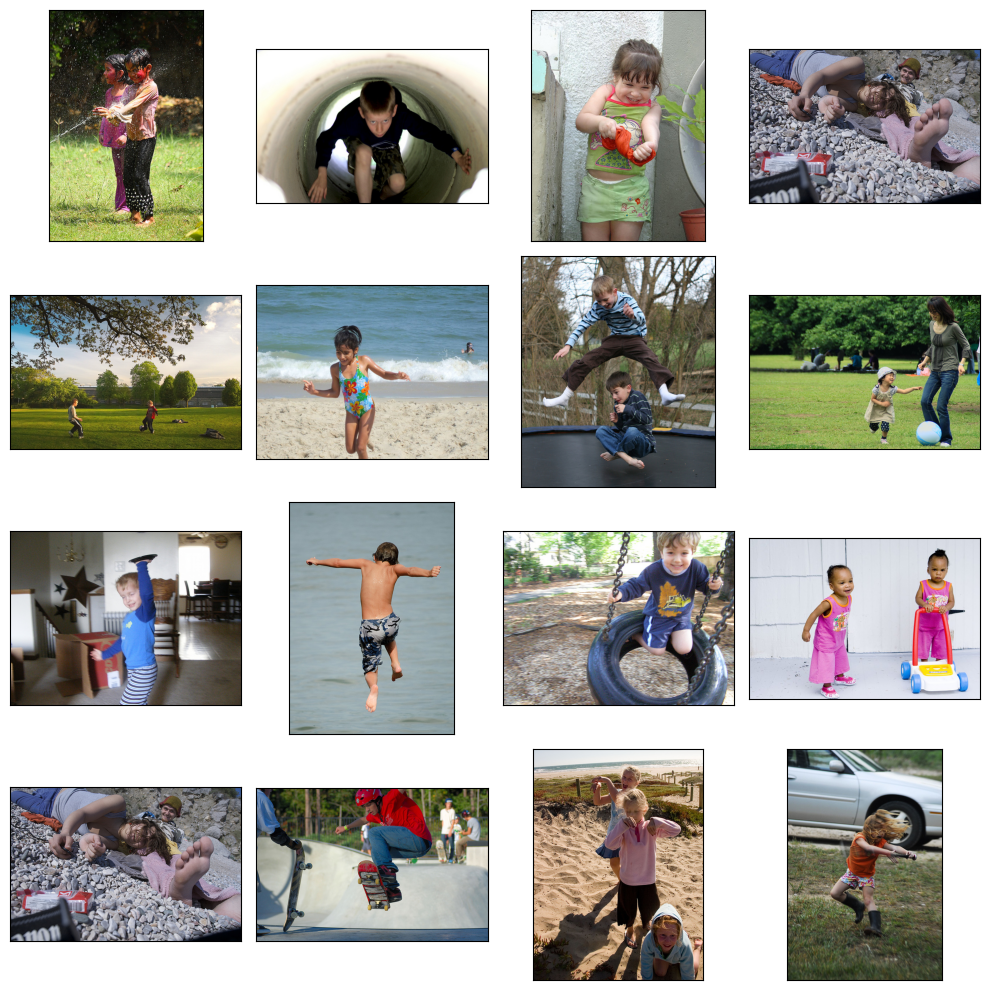

In [27]:
samples = list(df_train[df_train['to_block'] == 1]['query_id'].sample(16))
samples = [i[:-2] for i in samples]

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

In [28]:
df_train.drop(df_train[df_train['to_block'] == 1].index, inplace=True, errors='ignore')
df_train.drop(columns='to_block', inplace=True, errors='ignore')
df_train.reset_index(inplace=True, drop=True)

In [29]:
display(df_train.head(), df_queries.head())
df_train.info()
print('-' * 100)
df_queries.info()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,"A woman is signaling is to traffic , as seen f...",1.0
1,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,"A woman wearing black clothes , a purple scarf...",0.0
2,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,An older woman with blond hair rides a bicycle...,0.0
3,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,A woman wearing a white glove peers over the c...,0.0
4,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,A man taking a picture with a silver camera .,0.0


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36027 entries, 0 to 36026
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       36027 non-null  object 
 1   query_id    36027 non-null  object 
 2   query_text  36027 non-null  object 
 3   score       36027 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB
----------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


<div class="alert alert-secondary" role="alert">
<b>Заметка:</b></div>

Проведена проверка данных на содержание запрещенных слов (по списку слов для поиска нелегального контента), удалены данные.


## Векторизация изображений

In [30]:
def load_train(path=PATH) -> ImageDataGenerator:
    
    
    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        directory=Path(path, 'train_images'),
        x_col='image',
        y_col='score',
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        seed=SEED)
    
    return train_gen_flow

Found 36027 validated image filenames.


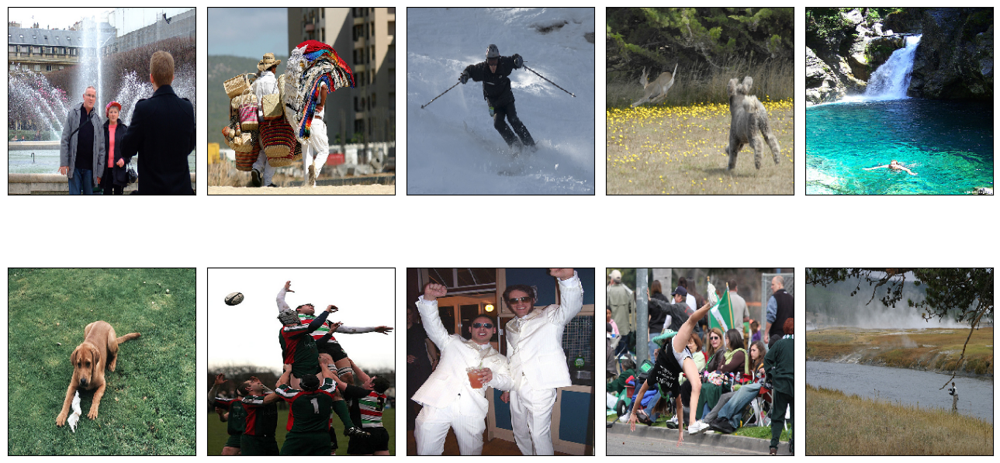

In [31]:
flow_train = load_train()
features, target = next(flow_train)

fig = plt.figure(figsize=(13,10))
for i in range(10):
    fig.add_subplot(2, 5, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [32]:
def create_model(input_shape=(256, 256, 3)):
    
    
    backbone = ResNet50(input_shape=input_shape,
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_absolute_error'])
    
    return model

In [33]:
def vectorize_pictures(model, train_data):
    
    
    predictions = model.predict(train_data)
    
    return predictions

In [34]:
pict_embeds = vectorize_pictures(create_model(), load_train())

94765736/94765736 [==============================] - 3s 0us/step
Found 36027 validated image filenames.
2252/2252 [==============================] - 191s 84ms/step


In [35]:
pict_embeds.shape

(36027, 2048)

<div class="alert alert-secondary" role="alert">
<b>Заметка:</b></div>
Эмбеддинги сформированы

## Векторизация текстов

In [36]:
bert = keras_nlp.models.BertBackbone.from_preset('bert_base_en')

Attaching 'config.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...
Attaching 'model.weights.h5' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...
/opt/conda/lib/python3.10/site-packages/keras_nlp/src/models/backbone.py:93: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/opt/conda/lib/python3.10/site-packages/keras_nlp/src/models/backbone.py:93: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids


In [37]:
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

Attaching 'tokenizer.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...
Attaching 'tokenizer.json' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...
Attaching 'assets/tokenizer/vocabulary.txt' from model 'keras/bert/keras/bert_base_en/2' to your Kaggle notebook...


In [38]:
def vectorize_text(model, data, preprocessor=preprocessor, batch_size=32, bar=True, verbose=0) -> np.array:
    

    embeddings = []
    tokenized = preprocessor(data)

    if bar:
        for i in notebook.tqdm(range(tokenized['token_ids'].shape[0] // batch_size + 1)):
        
            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]
            
            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types, 
                    'padding_mask' : mask}
                    
            batch_embeddings = model.predict(batch, verbose=verbose)
            
            embeddings.append(batch_embeddings['pooled_output'])

    else:
        for i in range(tokenized['token_ids'].shape[0] // batch_size + 1):
        
            tokens = tokenized['token_ids'][batch_size*i:batch_size*(i+1)]
            token_types = tokenized['segment_ids'][batch_size*i:batch_size*(i+1)]
            mask = tokenized['padding_mask'][batch_size*i:batch_size*(i+1)]
            
            batch = {'token_ids' : tokens,
                    'segment_ids' : token_types, 
                    'padding_mask' : mask}
                    
            batch_embeddings = model.predict(batch, verbose=verbose)
            
            embeddings.append(batch_embeddings['pooled_output'])

    return np.concatenate(embeddings)

In [39]:
text = list(df_train['query_text'])

In [40]:
text_embeds = vectorize_text(model=bert, data=text)

  0%|          | 0/1126 [00:00<?, ?it/s]

In [41]:
text_embeds.shape

(36027, 768)

<div class="alert alert-secondary" role="alert">
<b>Заметка:</b></div>
С помощью модели BERT base cased EN получены эмбеддинги текстов

## Объединение векторов

In [42]:
X = np.concatenate((pict_embeds, text_embeds), axis=1)
X.shape

(36027, 2816)

In [43]:
y = np.array(df_train['score'])
y.shape

(36027,)

In [44]:
with open('X.pickle', 'wb') as f:
    pickle.dump(X, f)

with open('y.pickle', 'wb') as f:
    pickle.dump(y, f)

<div class="alert alert-secondary" role="alert">
<b>Заметка:</b></div>

Объединены векторы изображений и векторы текстов

## Обучение модели предсказания соответствия

In [45]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=SEED)
train_indices, test_indices = next(gss.split(X=X, y=y, groups=df_train['image']))

In [46]:
X_train, X_test = X[train_indices], X[test_indices]

In [47]:
y_train, y_test = y[train_indices], y[test_indices]

In [48]:
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

<div class="alert alert-secondary" role="alert">
<b>Заметка:</b></div>

**Метрики:**

- коэффициент детерминации r2 (доля дисперсии, объясняемая моделью) - малоинформативен для нашей задачи;
- MAPE - в случае когда цели близки к нулю может давать завышенные результаты и при этом лучше себя показывает если среди целей есть большой разброс;
- RMSE - будет активнее реагировать на большие выбросы предсказаниях (т.к. цель и предсказания возводятся в квадрат до вычисления разницы). 

Выбранная метрика - RMSE.

### LinearRegression

In [49]:
model = LinearRegression(n_jobs=-1)
model.fit(X_train, y_train)
score = cross_val_score(
    model, X_train, y_train, groups=df_train['image'].loc[train_indices],
    scoring='neg_root_mean_squared_error',
    cv=GroupShuffleSplit(random_state=SEED)
).mean()
abs(score).round(decimals=3)

0.216

### RandomForestRegressor

In [50]:
model = RandomForestRegressor(random_state=SEED, verbose=3)

param_grid = {
    'n_estimators':[5],
    'max_depth':[16]
}

gs_rfr = GridSearchCV(
    model,
    param_grid,
    n_jobs=1,
    scoring='neg_root_mean_squared_error',
    cv=GroupShuffleSplit(n_splits=3, random_state=SEED),
    verbose=3
)

In [51]:
gs_rfr.fit(X_train, y_train, groups=df_train['image'].loc[train_indices])

Fitting 3 folds for each of 1 candidates, totalling 3 fits
building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5
[CV 1/3] END .....max_depth=16, n_estimators=5;, score=-0.223 total time= 1.7min
building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5
[CV 2/3] END .....max_depth=16, n_estimators=5;, score=-0.222 total time= 1.7min
building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5
[CV 3/3] END .....max_depth=16, n_estimators=5;, score=-0.233 total time= 1.7min
building tree 1 of 5
building tree 2 of 5
building tree 3 of 5
building tree 4 of 5
building tree 5 of 5


GridSearchCV(cv=GroupShuffleSplit(n_splits=3, random_state=2210, test_size=None,
         train_size=None),
             estimator=RandomForestRegressor(random_state=2210, verbose=3),
             n_jobs=1, param_grid={'max_depth': [16], 'n_estimators': [5]},
             scoring='neg_root_mean_squared_error', verbose=3)

In [52]:
pd.DataFrame(gs_rfr.cv_results_)[['mean_test_score']].round(decimals=3)

,mean_test_score
0,-0.226


In [53]:
rfr_pred = gs_rfr.predict(X_test)
rfr_result = mean_absolute_error(y_test, rfr_pred).round(decimals=3)
rfr_result

0.141

### NeuralNetwork

In [54]:
NN = Sequential()
NN.add(Dense(2816, input_shape=(2816,), activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(256, activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(1, activation='relu'))

optimizer = Adam(learning_rate=1e-5)

NN.compile(optimizer=optimizer, loss='mean_squared_error',
            metrics=[tf.keras.metrics.RootMeanSquaredError()])

NN.build()

NN.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 2816)              7932672   
                                                                 
 batch_normalization (Batch  (None, 2816)              11264     
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 256)               721152    
                                                                 
 batch_normalization_1 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 8666369 (33.06 MB)
Trainable params: 866

In [55]:
NN.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32, epochs=10,
    verbose=2, shuffle=True
    )

Epoch 1/10


I0000 00:00:1713869418.022363      82 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


898/898 - 6s - loss: 0.2442 - root_mean_squared_error: 0.4942 - val_loss: 0.1027 - val_root_mean_squared_error: 0.3205 - 6s/epoch - 7ms/step
Epoch 2/10
898/898 - 4s - loss: 0.0969 - root_mean_squared_error: 0.3113 - val_loss: 0.0754 - val_root_mean_squared_error: 0.2745 - 4s/epoch - 4ms/step
Epoch 3/10
898/898 - 4s - loss: 0.0702 - root_mean_squared_error: 0.2650 - val_loss: 0.0679 - val_root_mean_squared_error: 0.2606 - 4s/epoch - 4ms/step
Epoch 4/10
898/898 - 4s - loss: 0.0596 - root_mean_squared_error: 0.2441 - val_loss: 0.0637 - val_root_mean_squared_error: 0.2523 - 4s/epoch - 4ms/step
Epoch 5/10
898/898 - 4s - loss: 0.0543 - root_mean_squared_error: 0.2330 - val_loss: 0.0635 - val_root_mean_squared_error: 0.2519 - 4s/epoch - 4ms/step
Epoch 6/10
898/898 - 4s - loss: 0.0532 - root_mean_squared_error: 0.2307 - val_loss: 0.0637 - val_root_mean_squared_error: 0.2524 - 4s/epoch - 4ms/step
Epoch 7/10
898/898 - 4s - loss: 0.0505 - root_mean_squared_error: 0.2247 - val_loss: 0.0618 - val_r

In [56]:
nn_pred = NN.predict(X_test)
nn_result = mean_absolute_error(y_test, nn_pred).round(decimals=3)
nn_result

229/229 [==============================] - 0s 2ms/step


0.102

In [57]:
result_dict = {'model':['LinearRegression',
                        'RandomForestRegressor',
                        'NN'],
               'score':[score*-1,
                        rfr_result,
                        nn_result
                       ]
              }
df_results = pd.DataFrame(result_dict)
df_results

,model,score
0,LinearRegression,0.216238
1,RandomForestRegressor,0.141000
2,NN,0.102000


<div class="alert alert-secondary" role="alert">
<b>Заметка:</b></div>

Наилучший результат показала нейронная сеть с RMSE=0.1

## Тестирование модели

In [58]:
def load_test(path=PATH) -> ImageDataGenerator:
    
    
    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_images,
        directory=Path(path, 'test_images'),
        x_col='image',
        y_col=None,
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        seed=SEED)
    
    return train_gen_flow

In [59]:
pict_embeds_test = vectorize_pictures(create_model(), load_test())
pict_embeds_test.shape

Found 100 validated image filenames.
7/7 [==============================] - 2s 225ms/step


(100, 2048)

In [60]:
def get_picture(text) -> None:

    if [i for i in get_lemmas(text) if i in BLOCK]: #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = vectorize_text(model=bert, data=[text], bar=False) #получаем эмбеддинг текста
        X = np.concatenate(( #объединяем вектора тестовых картинок с эмбеддингом текста
            pict_embeds_test,
            np.resize(text_embed, (pict_embeds_test.shape[0],768))),
            axis=1)
        X = scaler.transform(X)
        predictions = NN.predict(X) #получаем предсказания оценок экспертов
        df = pd.concat((df_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам картинок
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок
        
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        
        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if text in list(df_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        plt.show()

    return None

In [61]:
samples = df_queries.sample(10)
text_test = list(samples['query_text'])
text_test

['Two white dogs chase after a red ball in a yard in front of a white fence .',
 'Children in swimming suits playing in water .',
 'a blond man jumping off a cliff into some water',
 'Two women , one with a head bandanna , are standing next to each other while one holds a bottle .',
 'An Asian woman is taking a photograph outside a white columned building .',
 'A girl cross-country skis .',
 'A man wears an interesting blue wig in public',
 'Several dogs are running outside , with two vehicles in the background .',
 'A boy wearing blue shorts is bouncing a basketball in front of the net .',
 'Two boys are squirting water guns at each other .']

4/4 [==============================] - 0s 6ms/step

-------------------- Two white dogs chase after a red ball in a yard in front of a white fence . --------------------



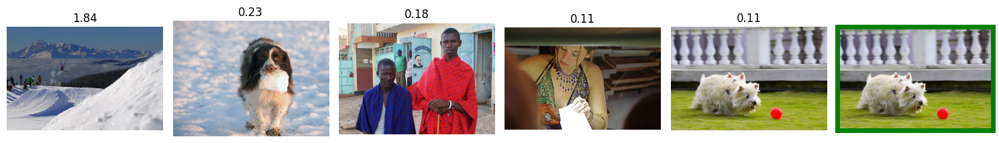


-------------------- Children in swimming suits playing in water . --------------------

This image is unavailable in your country in compliance with local laws.

4/4 [==============================] - 0s 2ms/step

-------------------- a blond man jumping off a cliff into some water --------------------



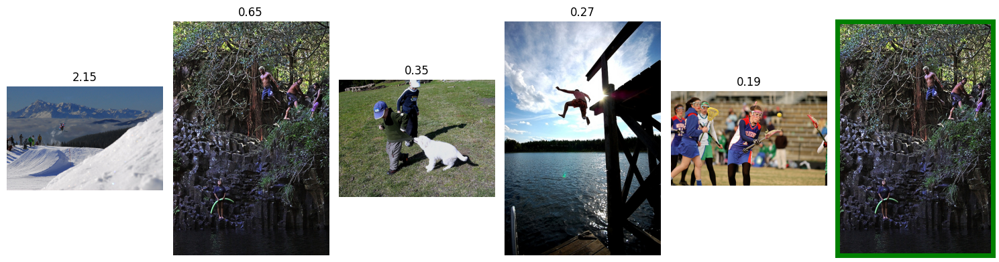

4/4 [==============================] - 0s 2ms/step

-------------------- Two women , one with a head bandanna , are standing next to each other while one holds a bottle . --------------------



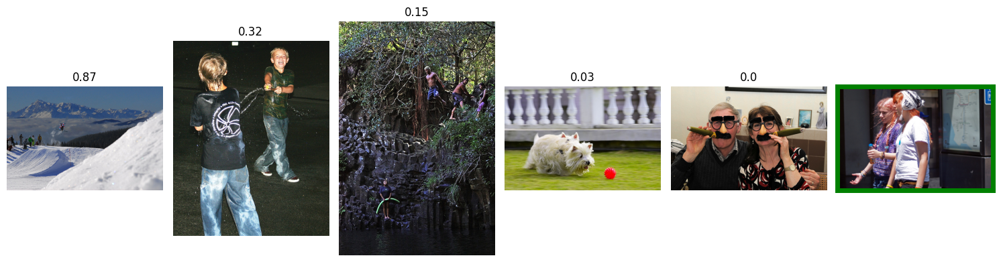

4/4 [==============================] - 0s 2ms/step

-------------------- An Asian woman is taking a photograph outside a white columned building . --------------------



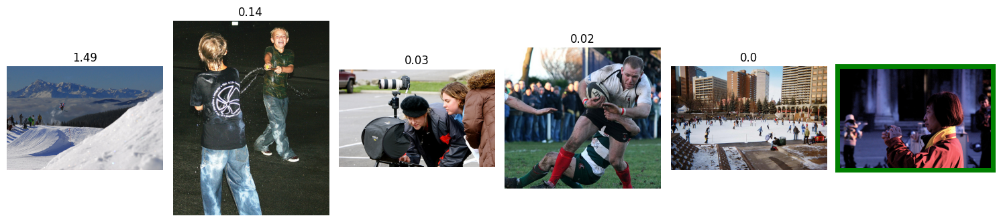


-------------------- A girl cross-country skis . --------------------

This image is unavailable in your country in compliance with local laws.

4/4 [==============================] - 0s 2ms/step

-------------------- A man wears an interesting blue wig in public --------------------



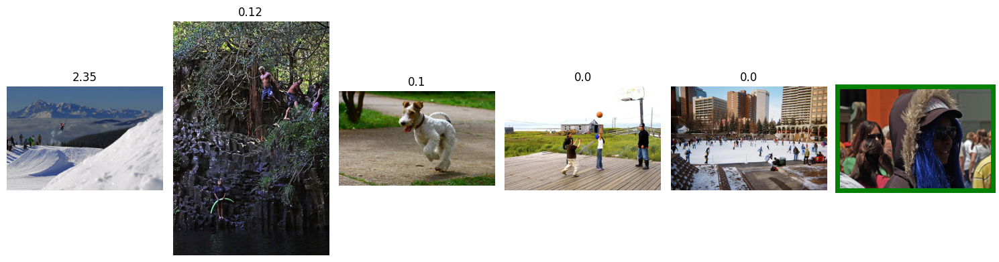

4/4 [==============================] - 0s 2ms/step

-------------------- Several dogs are running outside , with two vehicles in the background . --------------------



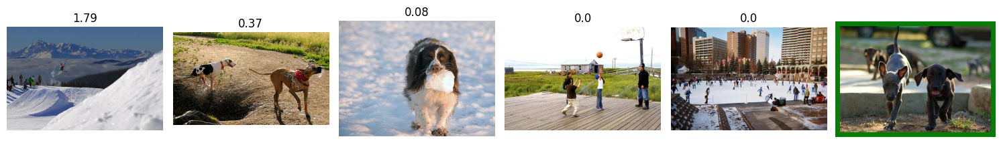


-------------------- A boy wearing blue shorts is bouncing a basketball in front of the net . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- Two boys are squirting water guns at each other . --------------------

This image is unavailable in your country in compliance with local laws.



In [62]:
for text in text_test:
    get_picture(text)

In [63]:
requests = ['multiple trees',
            'dog is playing',
            'We do business around the world',
            'man in the park',
            'hollidays'
           ]


4/4 [==============================] - 0s 2ms/step

-------------------- multiple trees --------------------



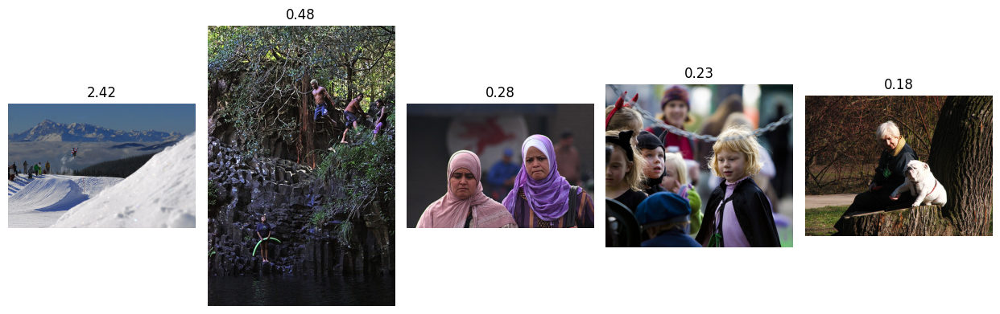

4/4 [==============================] - 0s 2ms/step

-------------------- dog is playing --------------------



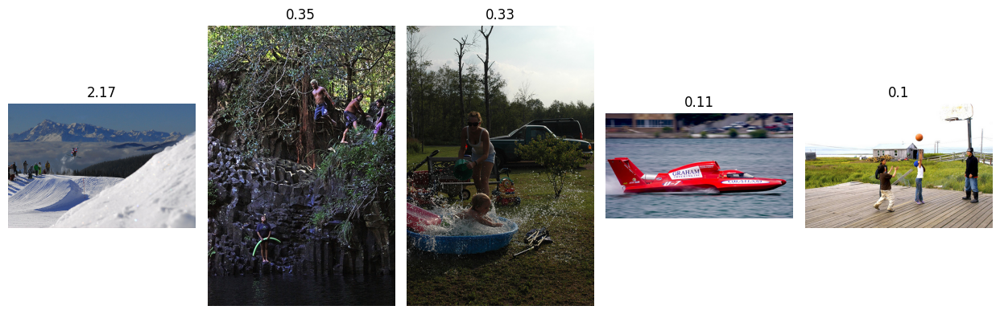

4/4 [==============================] - 0s 2ms/step

-------------------- We do business around the world --------------------



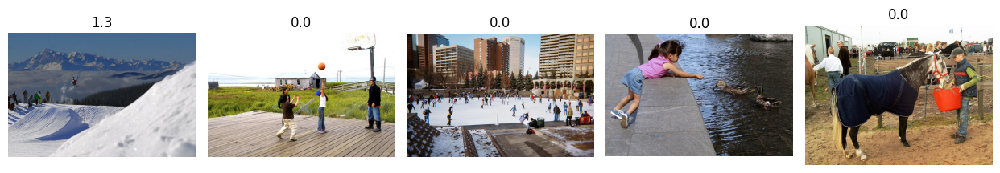

4/4 [==============================] - 0s 2ms/step

-------------------- man in the park --------------------



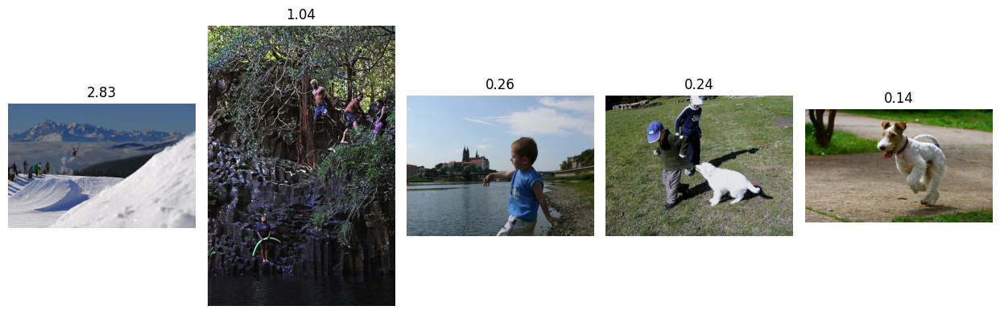

4/4 [==============================] - 0s 2ms/step

-------------------- hollidays --------------------



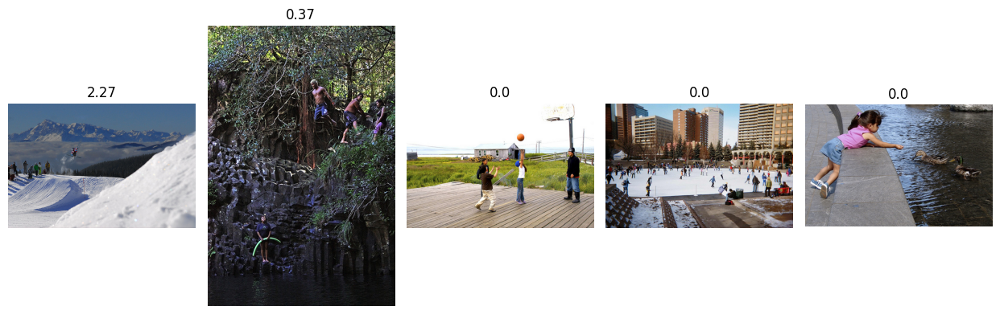

In [64]:
for text in requests:
    get_picture(text)

## Заключение

1) Был создан MVP для системы поиска изображений по фотографии.

2) В ходе работы для векторизации изображений использовалась сеть ResNet50, а для текстовых эмбеддингов BERT base cased EN.

3) Исследованы модели:

* LinearRegression
* RandomForestRegressor
* Нейронная сеть

4) Наилучший результат показала нейронная сеть с RMSE=0.1.

5) MVP показывает низкую стабильность с точки зрения предоставления релевантных резульатов. Только в некоторых случаях в выдачу попадает верная картинка и, чуть чаще, попадают картинки связанные тематически. Возможно, что предоставленный датасет содержит слишком мало данных для поиска хотябы одного дополнительного изображения, связанного с предоставленным описанием. Также улучшить показатели сети могло бы увеличение предоставленных данных как для тренировки, так и для тестирования.


